first we will import all the necessary libraries which will be usefull for analysis of data

In [1]:
#import all libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.linear_model import LogisticRegression,Lasso,LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.decomposition import PCA
from scipy.stats import zscore
from sklearn.model_selection import cross_val_score

now lets we will extract the data in our jupyter notebook by using pandas library 

In [2]:
data=pd.read_excel("C:\\Users\\SAI BABA\\Desktop\\customer_retention_dataset.xlsx")
data.head()

,1Gender of respondent,2 How old are you,3 Which city do you shop online from,4 What is the Pin Code of where you shop online from,5 Since How Long You are Shopping Online,6 How many times you have made an online purchase in the past 1 year,7 How do you access the internet while shopping on-line,8 Which device do you use to access the online shopping,9 What is the screen size of your mobile device\t\t\t\t,10 What is the operating system (OS) of your device\t\t,...,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer would you recommend to a friend?
0,0,3,Delhi,110009,5,4,4,3,5,1,...,Amazon.in,Amazon.in,Flipkart.com,Flipkart.com,Amazon.in,Paytm.com,Flipkart.com,Amazon.in,Amazon.in,Flipkart.com
1,1,2,Delhi,110030,5,5,2,1,2,3,...,"Amazon.in, Flipkart.com",Myntra.com,snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Myntra.com,"Amazon.in, Flipkart.com","Amazon.in, Myntra.com"
2,1,2,Greater Noida,201308,4,5,3,1,4,2,...,Myntra.com,Myntra.com,Myntra.com,Myntra.com,Amazon.in,Paytm.com,Paytm.com,Paytm.com,Amazon.in,"Amazon.in, Paytm.com, Myntra.com"
3,0,2,Karnal,132001,4,1,3,1,4,3,...,Snapdeal.com,"Myntra.com, Snapdeal.com",Myntra.com,Paytm.com,Paytm.com,Paytm.com,"Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com"
4,1,2,Bangalore,530068,3,2,2,1,2,3,...,"Flipkart.com, Paytm.com",Paytm.com,Paytm.com,Paytm.com,Snapdeal.com,Paytm.com,Amazon.in,Snapdeal.com,Paytm.com,"Amazon.in, Myntra.com"


table shows the data along various columns in integer and float type ,there are total 71 columns

now lets we will encode the column i.e will convert object type column to integer by labelencoder

# DATA ENCODING

In [3]:
from sklearn.preprocessing import LabelEncoder

In [4]:
le=LabelEncoder()
label=le.fit_transform(data["3 Which city do you shop online from"])
label
data=data.drop("3 Which city do you shop online from",axis='columns')
data["3 Which city do you shop online from"]=label


In [5]:
le=LabelEncoder()
label=le.fit_transform(data["Which of the Indian online retailer would you recommend to a friend?"])
label
data=data.drop("Which of the Indian online retailer would you recommend to a friend?",axis='columns')
data["Which of the Indian online retailer would you recommend to a friend?"]=label


In [6]:
le=LabelEncoder()
label=le.fit_transform(data["Website is as efficient as before"])
label
data=data.drop("Website is as efficient as before",axis='columns')
data["Website is as efficient as before"]=label




In [7]:
le=LabelEncoder()
label=le.fit_transform(data["Frequent disruption when moving from one page to another"])
label
data=data.drop("Frequent disruption when moving from one page to another",axis='columns')
data["Frequent disruption when moving from one page to another"]=label


In [8]:
le=LabelEncoder()
label=le.fit_transform(data["Change in website/Application design"])
label
data=data.drop("Change in website/Application design",axis='columns')
data["Change in website/Application design"]=label


In [9]:
le=LabelEncoder()
label=le.fit_transform(data["Longer delivery period"])
label
data=data.drop("Longer delivery period",axis='columns')
data["Longer delivery period"]=label


In [10]:
le=LabelEncoder()
label=le.fit_transform(data["Limited mode of payment on most products (promotion, sales period)"])
label
data=data.drop("Limited mode of payment on most products (promotion, sales period)",axis='columns')
data["Limited mode of payment on most products (promotion, sales period)"]=label


In [11]:
le=LabelEncoder()
label=le.fit_transform(data["Longer page loading time (promotion, sales period)"])
label
data=data.drop("Longer page loading time (promotion, sales period)",axis='columns')
data["Longer page loading time (promotion, sales period)"]=label


In [12]:
le=LabelEncoder()
label=le.fit_transform(data["Late declaration of price (promotion, sales period)"])
label
data=data.drop("Late declaration of price (promotion, sales period)",axis='columns')
data["Late declaration of price (promotion, sales period)"]=label


In [13]:
le=LabelEncoder()
label=le.fit_transform(data["Longer time in displaying graphics and photos (promotion, sales period)"])
label
data=data.drop("Longer time in displaying graphics and photos (promotion, sales period)",axis='columns')
data["Longer time in displaying graphics and photos (promotion, sales period)"]=label


In [14]:
le=LabelEncoder()
label=le.fit_transform(data["Longer time to get logged in (promotion, sales period)"])
label
data=data.drop("Longer time to get logged in (promotion, sales period)",axis='columns')
data["Longer time to get logged in (promotion, sales period)"]=label


In [15]:
le=LabelEncoder()
label=le.fit_transform(data["Presence of online assistance through multi-channel"])
label
data=data.drop("Presence of online assistance through multi-channel",axis='columns')
data["Presence of online assistance through multi-channel"]=label


In [16]:
le=LabelEncoder()
label=le.fit_transform(data["Perceived Trustworthiness"])
label
data=data.drop("Perceived Trustworthiness",axis='columns')
data["Perceived Trustworthiness"]=label


In [17]:
le=LabelEncoder()
label=le.fit_transform(data["Security of customer financial information"])
label
data=data.drop("Security of customer financial information",axis='columns')
data["Security of customer financial information"]=label


In [18]:
le=LabelEncoder()
label=le.fit_transform(data["Privacy of customers’ information"])
label
data=data.drop("Privacy of customers’ information",axis='columns')
data["Privacy of customers’ information"]=label


In [19]:
le=LabelEncoder()
label=le.fit_transform(data["Speedy order delivery "])
label
data=data.drop("Speedy order delivery ",axis='columns')
data["Speedy order delivery "]=label


In [20]:
le=LabelEncoder()
label=le.fit_transform(data["Availability of several payment options"])
label
data=data.drop("Availability of several payment options",axis='columns')
data["Availability of several payment options"]=label


In [21]:
le=LabelEncoder()
label=le.fit_transform(data["Quickness to complete purchase"])
label
data=data.drop("Quickness to complete purchase",axis='columns')
data["Quickness to complete purchase"]=label


In [22]:
le=LabelEncoder()
label=le.fit_transform(data["Reliability of the website or application"])
label
data=data.drop("Reliability of the website or application",axis='columns')
data["Reliability of the website or application"]=label


In [23]:
le=LabelEncoder()
label=le.fit_transform(data["Fast loading website speed of website and application"])
label
data=data.drop("Fast loading website speed of website and application",axis='columns')
data["Fast loading website speed of website and application"]=label


In [24]:
le=LabelEncoder()
label=le.fit_transform(data["Complete, relevant description information of products"])
label
data=data.drop("Complete, relevant description information of products",axis='columns')
data["Complete, relevant description information of products"]=label


In [25]:
le=LabelEncoder()
label=le.fit_transform(data["Wild variety of product on offer"])
label
data=data.drop("Wild variety of product on offer",axis='columns')
data["Wild variety of product on offer"]=label


In [26]:
le=LabelEncoder()
label=le.fit_transform(data["Visual appealing web-page layout"])
label
data=data.drop("Visual appealing web-page layout",axis='columns')
data["Visual appealing web-page layout"]=label


In [27]:
le=LabelEncoder()
label=le.fit_transform(data["From the following, tick any (or all) of the online retailers you have shopped from                                                                          "])
label
data=data.drop("From the following, tick any (or all) of the online retailers you have shopped from                                                                          ",axis='columns')
data["From the following, tick any (or all) of the online retailers you have shopped from                                                                          "]=label

In [28]:
le=LabelEncoder()
label=le.fit_transform(data["Easy to use website or application"])
label
data=data.drop("Easy to use website or application",axis='columns')
data["Easy to use website or application"]=label
data

,1Gender of respondent,2 How old are you,4 What is the Pin Code of where you shop online from,5 Since How Long You are Shopping Online,6 How many times you have made an online purchase in the past 1 year,7 How do you access the internet while shopping on-line,8 Which device do you use to access the online shopping,9 What is the screen size of your mobile device\t\t\t\t,10 What is the operating system (OS) of your device\t\t,11 What browser do you run on your device to access the website,...,Speedy order delivery,Availability of several payment options,Quickness to complete purchase,Reliability of the website or application,Fast loading website speed of website and application,"Complete, relevant description information of products",Wild variety of product on offer,Visual appealing web-page layout,"From the following, tick any (or all) of the online retailers you have shopped from",Easy to use website or application
0,0,3,110009,5,4,4,3,5,1,1,...,0,9,8,9,9,10,5,7,7,9
1,1,2,110030,5,5,2,1,2,3,1,...,1,2,2,8,2,2,6,5,2,3
2,1,2,201308,4,5,3,1,4,2,1,...,0,10,5,6,7,7,4,6,8,7
3,0,2,132001,4,1,3,1,4,3,2,...,3,2,3,3,6,1,1,3,4,4
4,1,2,530068,3,2,2,1,2,3,2,...,0,4,4,6,0,5,7,9,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,1,2,173212,2,1,3,1,4,2,4,...,0,0,0,0,0,0,0,0,0,0
265,1,3,201008,2,4,3,1,5,2,1,...,4,7,6,7,8,8,0,0,1,8
266,1,4,560010,3,1,3,2,5,1,1,...,0,1,0,0,0,0,0,0,6,0
267,1,1,173229,3,1,2,1,4,2,1,...,5,8,7,2,3,3,2,2,2,3


so table contains all 71 column and they are having integer values in it,we have encoded the object type data by LabelEncoder so now data is more simplified for further analysis
lets will check the total number of column present in data set

In [29]:
data.columns

Index(['1Gender of respondent', '2 How old are you ',
       '4 What is the Pin Code of where you shop online from',
       '5 Since How Long You are Shopping Online ',
       '6 How many times you have made an online purchase in the past 1 year',
       '7 How do you access the internet while shopping on-line',
       '8 Which device do you use to access the online shopping',
       '9 What is the screen size of your mobile device\t\t\t\t                                        ',
       '10 What is the operating system (OS) of your device\t\t                                          ',
       '11 What browser do you run on your device to access the website                                                 ',
       '12 Which channel did you follow to arrive at your favorite online store for the first time                                                                 ',
       '13 After first visit, how do you reach the online retail store                                       ',
     

In [30]:
data.dtypes

1Gender of respondent                                                                                                                                            int64
2 How old are you                                                                                                                                                int64
4 What is the Pin Code of where you shop online from                                                                                                             int64
5 Since How Long You are Shopping Online                                                                                                                         int64
6 How many times you have made an online purchase in the past 1 year                                                                                             int64
                                                                                                                                                                 ... 

will check how many rows and columns are present in our dataset

In [31]:
data.shape

(269, 71)

so data contains total 269 rows and 71 columns

In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                                                                                                                                                                                          Non-Null Count  Dtype
---  ------                                                                                                                                                                                          --------------  -----
 0   1Gender of respondent                                                                                                                                                                           269 non-null    int64
 1   2 How old are you                                                                                                                                                                               269 non-null    int64
 2   4 What is the 

so there are 71 columns which have integer values in it 

now will check the null values present in our data set

In [33]:
data.isnull().sum().sum()

0

no NULL values present in our data set for better understanding we can also represent it with help of heatmap

In [34]:
import seaborn as sns

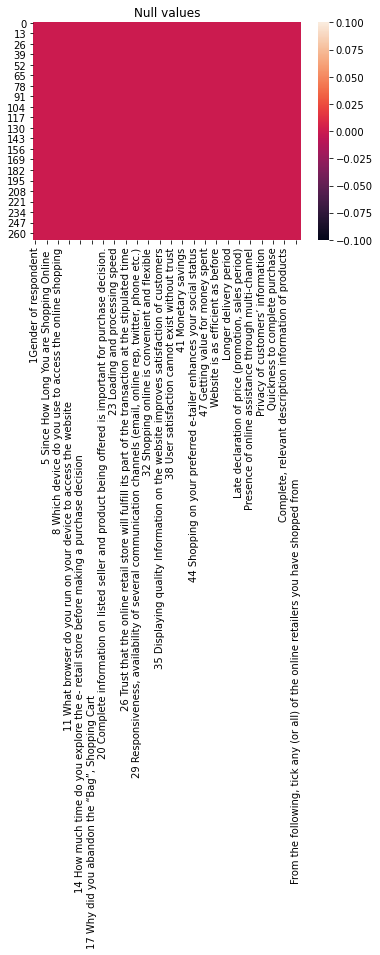

In [35]:
sns.heatmap(data.isnull())
plt.title("Null values")
plt.show()

it shows that there is no null values present in our dataset

# visualization

In [36]:
data_visualization=data[['1Gender of respondent']].copy()                                                                           

1    180
0     89
Name: 1Gender of respondent, dtype: int64


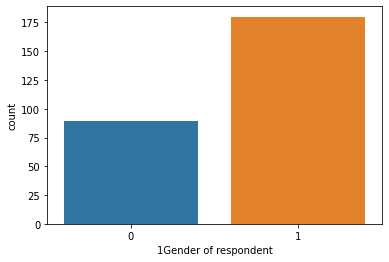

In [37]:
import seaborn as sns
ax=sns.countplot(x='1Gender of respondent',data=data_visualization)
print(data_visualization['1Gender of respondent'].value_counts())

the gender of respondant is 180 female and 89 are male out of 269 so %of female respondent is more as compare to male

In [38]:
data_visualization1=data[['3 Which city do you shop online from']].copy() 

2     58
4     43
9     40
0     37
6     27
3     18
10    18
5     12
7      9
8      5
1      2
Name: 3 Which city do you shop online from, dtype: int64


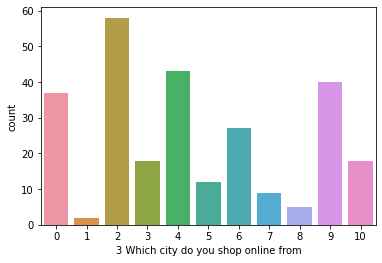

In [39]:
import seaborn as sns
ax=sns.countplot(x='3 Which city do you shop online from',data=data_visualization1)
print(data_visualization1['3 Which city do you shop online from'].value_counts())

city from which maximum % of online shopping done is city no 2

In [40]:
data_visualization2=data[['6 How many times you have made an online purchase in the past 1 year']].copy() 

1    114
4     63
5     53
2     29
3     10
Name: 6 How many times you have made an online purchase in the past 1 year, dtype: int64


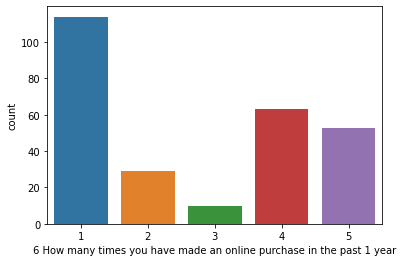

In [41]:
import seaborn as sns
ax=sns.countplot(x='6 How many times you have made an online purchase in the past 1 year',data=data_visualization2)
print(data_visualization2['6 How many times you have made an online purchase in the past 1 year'].value_counts())

so from category 1 we got maximum purchase

In [42]:
data_visualization3=data[['7 How do you access the internet while shopping on-line']].copy() 

3    118
2     76
5     71
4      4
Name: 7 How do you access the internet while shopping on-line, dtype: int64


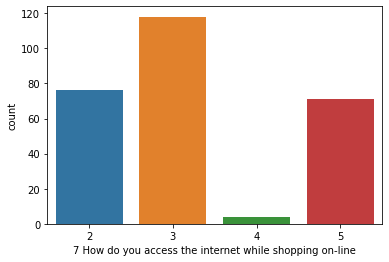

In [43]:
import seaborn as sns
ax=sns.countplot(x='7 How do you access the internet while shopping on-line',data=data_visualization3)
print(data_visualization3['7 How do you access the internet while shopping on-line'].value_counts())

while shopping online maximum access carried out through the category 3 i.e 118

In [44]:
data_visualization4=data[['8 Which device do you use to access the online shopping']].copy() 

1    141
2     86
3     30
4     12
Name: 8 Which device do you use to access the online shopping, dtype: int64


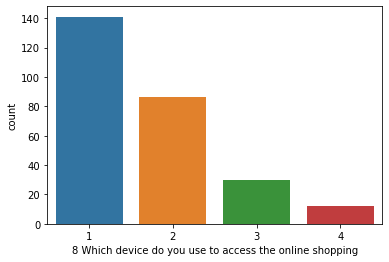

In [45]:
import seaborn as sns
ax=sns.countplot(x='8 Which device do you use to access the online shopping',data=data_visualization4)
print(data_visualization4['8 Which device do you use to access the online shopping'].value_counts())

device used to access the online shopping is from category 1 it is about 141

now lets will describe our data set for detail analysis

In [46]:
data.describe()

,1Gender of respondent,2 How old are you,4 What is the Pin Code of where you shop online from,5 Since How Long You are Shopping Online,6 How many times you have made an online purchase in the past 1 year,7 How do you access the internet while shopping on-line,8 Which device do you use to access the online shopping,9 What is the screen size of your mobile device\t\t\t\t,10 What is the operating system (OS) of your device\t\t,11 What browser do you run on your device to access the website,...,Speedy order delivery,Availability of several payment options,Quickness to complete purchase,Reliability of the website or application,Fast loading website speed of website and application,"Complete, relevant description information of products",Wild variety of product on offer,Visual appealing web-page layout,"From the following, tick any (or all) of the online retailers you have shopped from",Easy to use website or application
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,...,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000
mean,0.669145,2.959108,220465.747212,3.524164,2.672862,3.260223,1.676580,4.282528,1.776952,1.275093,...,1.301115,3.680297,2.921933,3.237918,3.762082,3.003717,2.185874,2.977695,3.791822,3.472119
std,0.471398,1.066012,140524.341051,1.436586,1.651788,1.135887,0.843904,0.923426,0.797892,0.645429,...,1.497024,3.043531,2.626899,2.861722,2.838155,3.025388,2.253278,2.809808,2.185725,2.415004
min,0.000000,1.000000,110008.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,122018.000000,3.000000,1.000000,2.000000,1.000000,4.000000,1.000000,1.000000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000
50%,1.000000,3.000000,201303.000000,4.000000,2.000000,3.000000,1.000000,4.000000,2.000000,1.000000,...,1.000000,3.000000,3.000000,3.000000,4.000000,1.000000,1.000000,2.000000,4.000000,3.000000
75%,1.000000,4.000000,201310.000000,5.000000,4.000000,5.000000,2.000000,5.000000,2.000000,1.000000,...,2.000000,5.000000,5.000000,6.000000,6.000000,5.000000,4.000000,5.000000,5.000000,5.000000
max,1.000000,5.000000,560037.000000,5.000000,5.000000,5.000000,4.000000,5.000000,3.000000,4.000000,...,5.000000,10.000000,8.000000,9.000000,9.000000,10.000000,8.000000,9.000000,8.000000,9.000000


it shows total count of every column that every column contains 269 values, also it shows mean and std of every column, we observe that value of std is low as compare to the mean value in every column it means that our dataset is good for analysis
also every column show its min,25%,50%,75%,max data values in it. 

now will check correlation of each column with its own and with other column

In [47]:
data.corr()

,1Gender of respondent,2 How old are you,4 What is the Pin Code of where you shop online from,5 Since How Long You are Shopping Online,6 How many times you have made an online purchase in the past 1 year,7 How do you access the internet while shopping on-line,8 Which device do you use to access the online shopping,9 What is the screen size of your mobile device\t\t\t\t,10 What is the operating system (OS) of your device\t\t,11 What browser do you run on your device to access the website,...,Speedy order delivery,Availability of several payment options,Quickness to complete purchase,Reliability of the website or application,Fast loading website speed of website and application,"Complete, relevant description information of products",Wild variety of product on offer,Visual appealing web-page layout,"From the following, tick any (or all) of the online retailers you have shopped from",Easy to use website or application
1Gender of respondent,1.000000,-0.034449,0.260696,-0.046005,0.076121,-0.200974,-0.241847,-0.058760,-0.038207,-0.116712,...,-0.085661,-0.050594,-0.060108,-0.118454,-0.209659,-0.124719,0.008932,-0.016861,-0.092448,-0.085157
2 How old are you,-0.034449,1.000000,-0.057393,0.014049,0.005089,0.024228,0.292176,0.227841,-0.133597,-0.151708,...,-0.169956,-0.082249,-0.153047,-0.108105,0.076937,0.038227,-0.223623,-0.048889,0.061991,0.010426
4 What is the Pin Code of where you shop online from,0.260696,-0.057393,1.000000,0.092980,-0.021229,0.134879,-0.103424,-0.189814,0.077905,0.063588,...,-0.172836,-0.046428,0.024672,0.041604,-0.102335,0.010051,0.141687,0.015560,-0.020076,-0.072228
5 Since How Long You are Shopping Online,-0.046005,0.014049,0.092980,1.000000,0.291104,0.080738,0.309634,0.118596,-0.141768,-0.236578,...,-0.051109,0.116130,0.044501,0.016749,0.258575,0.058788,-0.041737,0.001058,0.222638,0.123072
6 How many times you have made an online purchase in the past 1 year,0.076121,0.005089,-0.021229,0.291104,1.000000,0.135034,0.057656,-0.127544,0.040689,-0.153269,...,-0.154673,0.218856,0.147161,0.198083,0.222115,0.188406,0.187830,0.135899,0.182601,0.191331
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Complete, relevant description information of products",-0.124719,0.038227,0.010051,0.058788,0.188406,0.056179,0.177311,-0.035103,0.153374,-0.214545,...,-0.007663,0.801683,0.657814,0.751957,0.580239,1.000000,0.314080,0.435880,0.467335,0.863354
Wild variety of product on offer,0.008932,-0.223623,0.141687,-0.041737,0.187830,-0.000016,-0.284193,-0.674500,0.297102,-0.055815,...,-0.153819,0.252995,0.492271,0.730907,-0.054323,0.314080,1.000000,0.561130,0.215476,0.277978
Visual appealing web-page layout,-0.016861,-0.048889,0.015560,0.001058,0.135899,0.090677,-0.014069,-0.382971,0.244096,-0.021294,...,-0.144765,0.369167,0.330884,0.513897,0.138298,0.435880,0.561130,1.000000,0.314567,0.506901
"From the following, tick any (or all) of the online retailers you have shopped from",-0.092448,0.061991,-0.020076,0.222638,0.182601,0.074503,0.228363,0.147566,-0.101610,-0.292520,...,-0.284106,0.595739,0.237611,0.294289,0.596491,0.467335,0.215476,0.314567,1.000000,0.555926


lets will also correlate every column with its own and also with the other column ,that can be possible with the help of heatmap

<AxesSubplot:>

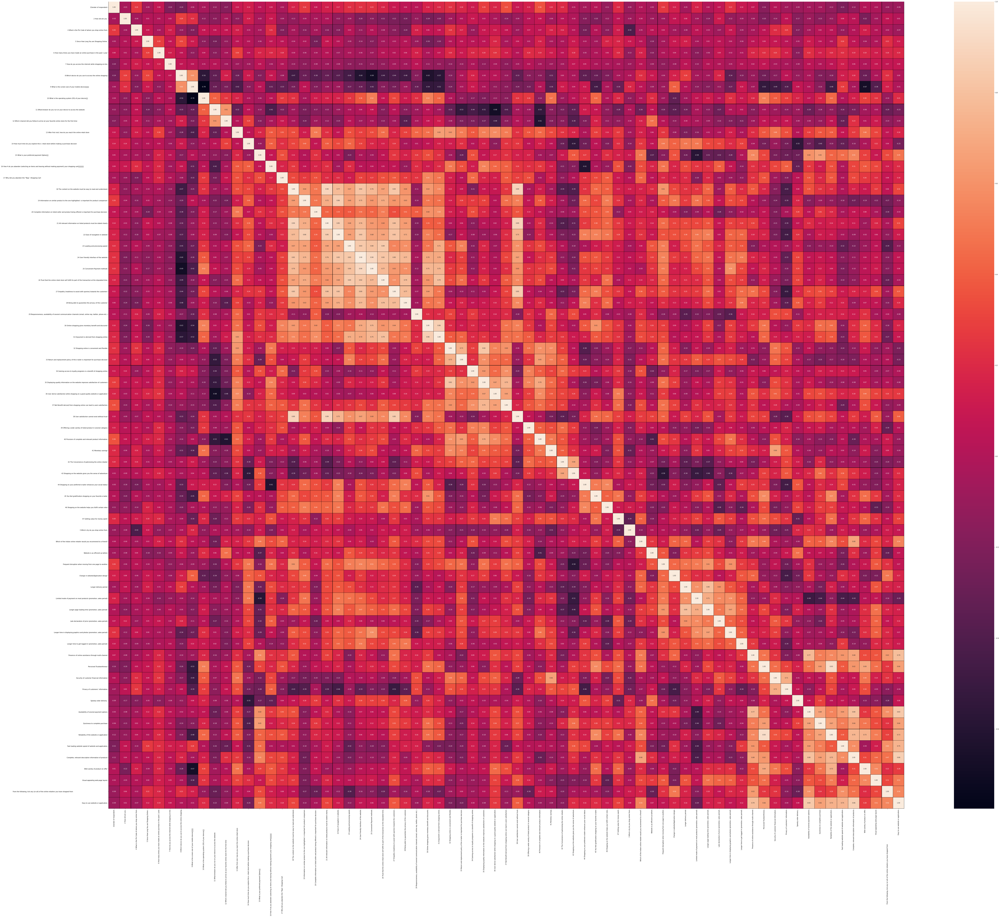

In [48]:
#heat map
plt.figure(figsize=(120,100))
sns.heatmap(data.corr(),annot=True,linewidths=0.1,linecolor='black',fmt='0.2f')

it shows that how data is correlated with each other also with its own,it also shows the positive and negative correlation of various features

now will plot subplot to know how data is distributed in every column

In [49]:
#now lets see how data is distributed in each column
plt.figure(figsize=(150,130),facecolor='white')
plotnumber=1
for column in data:
    if plotnumber<=71:
        ax=plt.subplot(11,7,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()    

subplot shows that some column data contains skewness which is required to remove and some are uniformely distributed,we also plot histogram for better understanding of how data is distributed in every column

array([[<AxesSubplot:title={'center':'1Gender of respondent'}>,
        <AxesSubplot:title={'center':'2 How old are you '}>,
        <AxesSubplot:title={'center':'4 What is the Pin Code of where you shop online from'}>,
        <AxesSubplot:title={'center':'5 Since How Long You are Shopping Online '}>,
        <AxesSubplot:title={'center':'6 How many times you have made an online purchase in the past 1 year'}>,
        <AxesSubplot:title={'center':'7 How do you access the internet while shopping on-line'}>,
        <AxesSubplot:title={'center':'8 Which device do you use to access the online shopping'}>],
       [<AxesSubplot:title={'center':'9 What is the screen size of your mobile device\t\t\t\t                                        '}>,
        <AxesSubplot:title={'center':'10 What is the operating system (OS) of your device\t\t                                          '}>,
        <AxesSubplot:title={'center':'11 What browser do you run on your device to access the website         

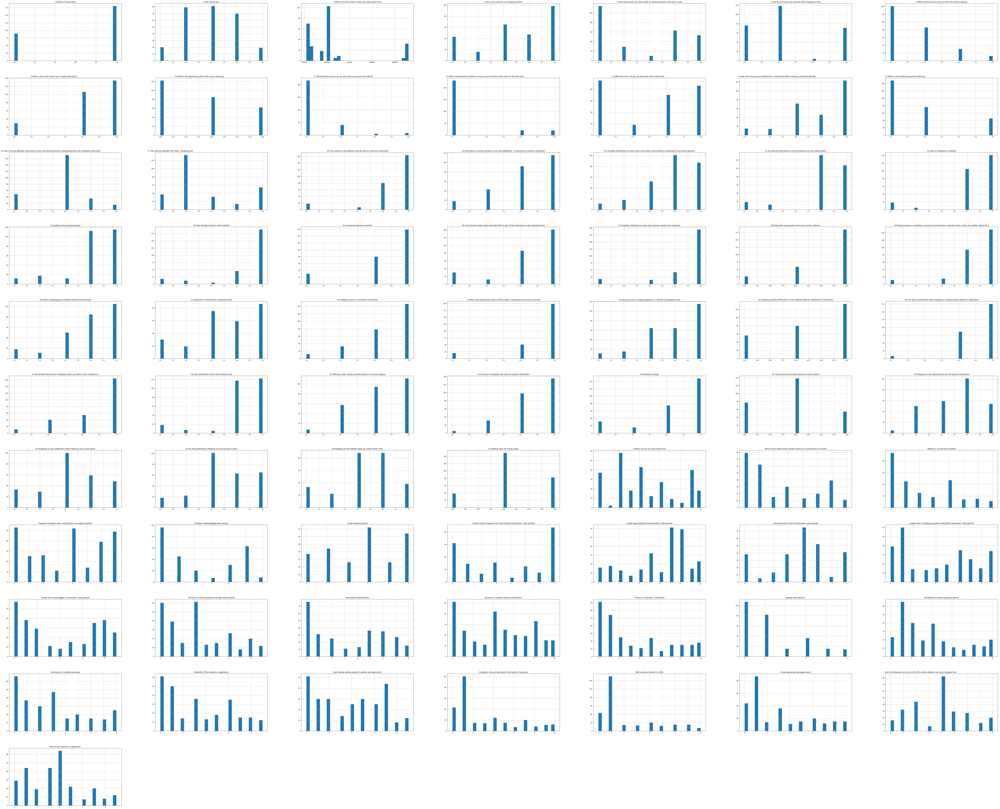

In [50]:
#plotting histogram for univariate analysis and checking the Normal Distribution
data.hist(figsize=(120,100), grid = True, layout = (11,7), bins = 30)

it shows that data is uniformely distibuted in some column and some contains skewness

now will check outliers present in our dataset with boxplot

1Gender of respondent                                                                                                                                              AxesSubplot(0.125,0.821923;0.0945122x0.0580769)
2 How old are you                                                                                                                                                AxesSubplot(0.238415,0.821923;0.0945122x0.0580...
4 What is the Pin Code of where you shop online from                                                                                                             AxesSubplot(0.351829,0.821923;0.0945122x0.0580...
5 Since How Long You are Shopping Online                                                                                                                         AxesSubplot(0.465244,0.821923;0.0945122x0.0580...
6 How many times you have made an online purchase in the past 1 year                                                                                        

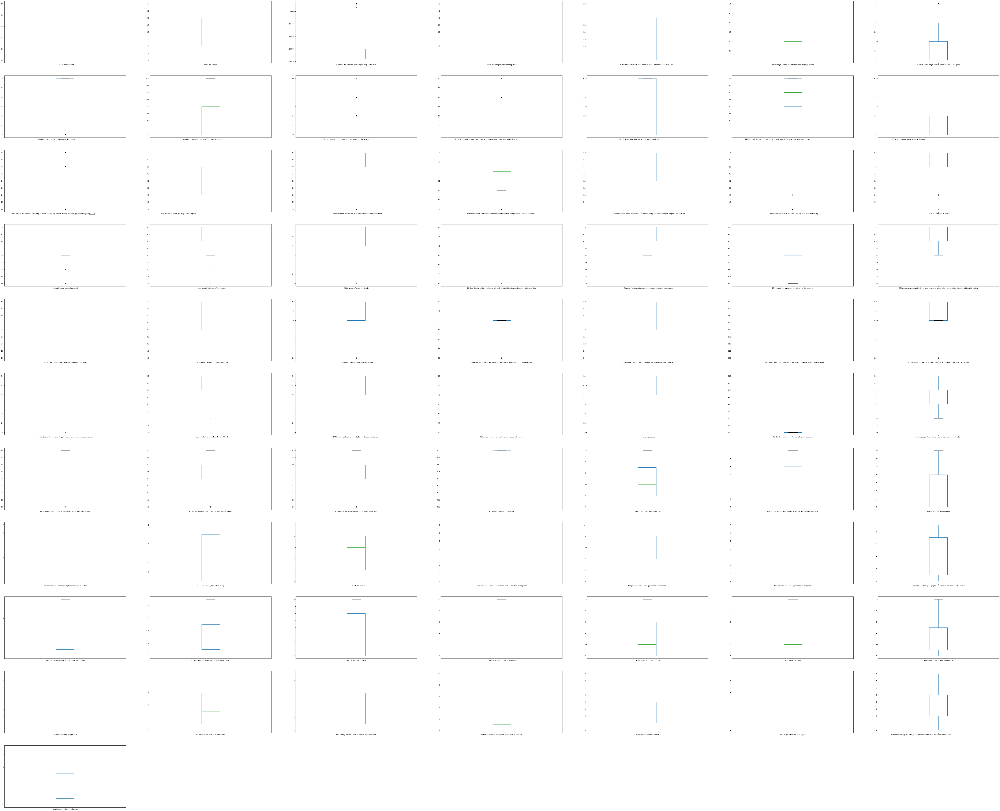

In [51]:
#plotting the boxplot of each column to check the outliers 
data.plot(kind='box',subplots = True,layout=(11,7),figsize = (120,100))

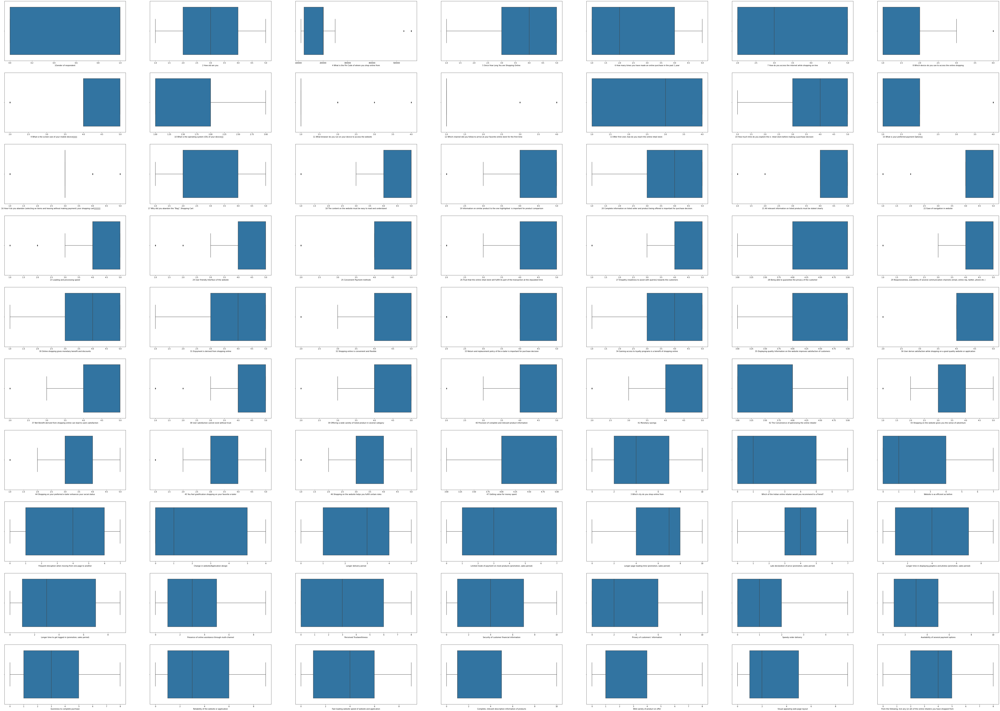

In [52]:
#visualize the outliers using boxplot
plt.figure(figsize=(100,80))
graph=1
for column in data:
    if graph<71:
        ax=plt.subplot(11,7,graph)
        sns.boxplot(data[column],orient='V')
        plt.xlabel(column,fontsize=10)
        graph+=1
plt.show()        

some column contains outliers which is required to remove,will remove it in further steps

lets will check the skewness present in our dataset

In [53]:
data.skew()

1Gender of respondent                                                                                                                                           -0.723007
2 How old are you                                                                                                                                                0.063243
4 What is the Pin Code of where you shop online from                                                                                                             1.748322
5 Since How Long You are Shopping Online                                                                                                                        -0.554705
6 How many times you have made an online purchase in the past 1 year                                                                                             0.227755
                                                                                                                                                      

now we will remove the outliers

In [54]:
#calculate the zscore
z = np.abs(zscore(data))
print(z)

[[1.42213639 0.03843148 0.78749796 ... 1.4341911  1.47052245 2.29324079]
 [0.70316744 0.9013929  0.78734824 ... 0.72107205 0.82131149 0.19585849]
 [0.70316744 0.9013929  0.13658457 ... 1.07763158 1.92888924 1.46354103]
 ...
 [0.70316744 0.97825586 2.42077023 ... 1.06172557 1.01215566 1.44040814]
 [0.70316744 1.84121727 0.33677293 ... 0.34860652 0.82131149 0.19585849]
 [0.70316744 0.97825586 0.13871628 ... 1.06172557 1.73804507 1.44040814]]


In [55]:
threshold=3
print(np.where(z<3))
print(data.shape)

(array([  0,   0,   0, ..., 268, 268, 268], dtype=int64), array([ 0,  1,  2, ..., 68, 69, 70], dtype=int64))
(269, 71)


In [56]:
#Assign the value to df_new which are less the threshold value and removing the outliers
data_new=data[(z<3).all(axis = 1)]

In [57]:
print(data.shape)
print(data_new.shape)
data = data_new
print('Shape after removing outlires',data.shape)

(269, 71)
(215, 71)
Shape after removing outlires (215, 71)


so after removing the outliers we have 188 rows remain and 71 columns , now again will plot subplot to check how data is distributed after removing the outliers

In [58]:
#now lets see how data is distributed in each column
plt.figure(figsize=(150,130),facecolor='white')
plotnumber=1
for column in data:
    if plotnumber<=71:
        ax=plt.subplot(11,7,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()    

# conclusion

it shows that now data is uniformely distributed in columns and we can use now this data to built machine learning alogorithm for future prediction